In [10]:
%reload_ext autoreload
%autoreload 2
from matplotlib import pyplot as plt
import pandas as pd

In [2]:
from postprocessing.euclidean_distance import L2
from postprocessing.postprocessing import Post_Pipeline

In [17]:
fp = './WC_input/data/'
rp = './WC_result/data/'

model_name = 'seresnext101'
fold = 2
checkpoint = '20600'
algo = 'dist_global_org'

In [13]:
dist = L2(model_name, fold, checkpoint)
dist.querytopnclosest(100)

In [15]:
def get_img_ratio(x):
    img = plt.imread(fp+x)
    return img.shape[0]/img.shape[1]

def get_img_res(x):
    img = plt.imread(fp+x)
    return img.shape[0] * img.shape[1]

In [18]:
clean_pred = pd.DataFrame([dist.test[0],
                           dist.test[0].map(lambda x: get_img_ratio(x)), 
                           dist.test[0].map(lambda x: get_img_res(x))])

In [19]:
clean_pred = clean_pred.T

In [20]:
clean_pred.columns = ['img', 'ratio', 'res']

------------------------------------------------------------------------------

In [ ]:
df_img = dist.img_dist_class['img']
dfs = []
for i in range(0, df_img.shape[1]):
    dfs.append(df_img[i].value_counts().head())

In [43]:
bad_imgs = clean_pred[clean_pred.ratio>1].img.append(clean_pred[clean_pred.res<70992].img).append(pd.concat(dfs).reset_index()['index']).unique()

In [45]:
# clean_pred.sort_values('res').head(10)

In [44]:
# clean_pred.res.hist(bins=100);

In [49]:
bad_imgs[:20].shape

(20,)

In [50]:
imgs = bad_imgs[:20]

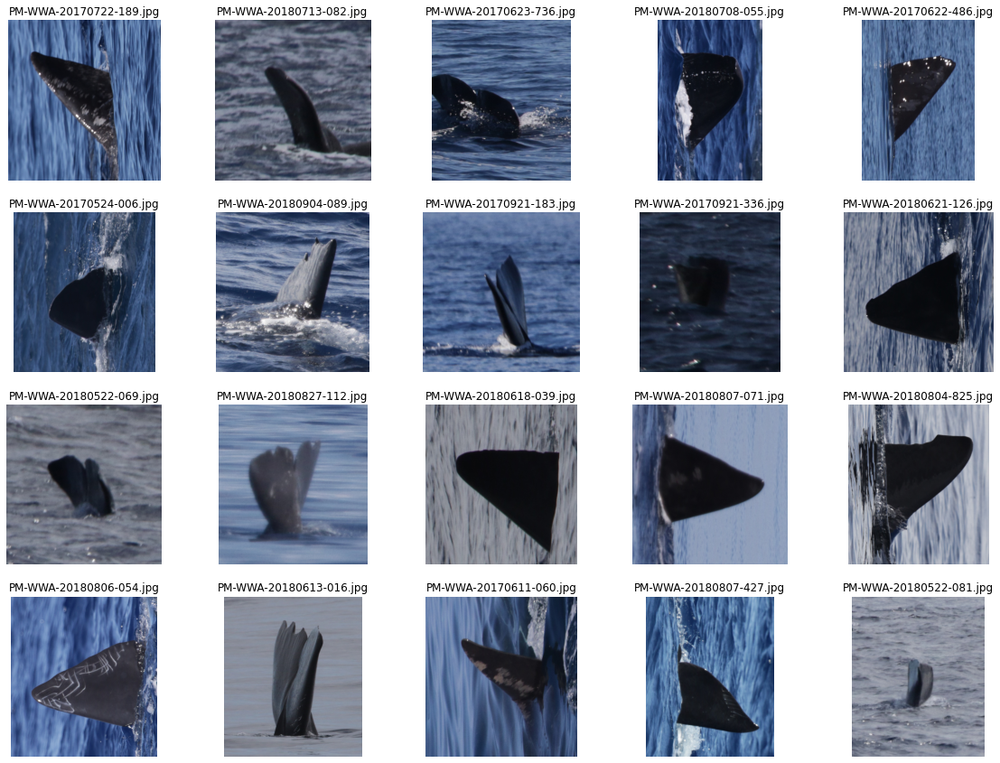

In [54]:
fp = './WC_input/'

f, axarr = plt.subplots(4, 5)
f.set_figwidth(20)
f.set_figheight(15)

for i in range(0, 20):
    img_name = imgs[i]
    img =  plt.imread(fp +'data/'+img_name)

    axarr[int(i/5), i%5].imshow(img)
    axarr[int(i/5), i%5].axis('off')
    axarr[int(i/5), i%5].set_title(img_name)

plt.show()

In [84]:
bad_test_img = ['PM-WWA-20180506-365.jpg',
'PM-WWA-20170819-391.jpg',
'PM-WWA-20170722-189.jpg',
'PM-WWA-20180522-176.jpg',
'PM-WWA-20170530-402.jpg',
'PM-WWA-20170707-335.jpg',
'PM-WWA-20180708-161.jpg',
'PM-WWA-20180806-067.jpg',
'PM-WWA-20180918-494.jpg',
'PM-WWA-20170720-081.jpg',
'PM-WWA-20180715-418.jpg',
'PM-WWA-20180713-082.jpg',
'PM-WWA-20170627-087.jpg',
'PM-WWA-20170707-364.jpg',
'PM-WWA-20170623-736.jpg',
'PM-WWA-20170714-046.jpg',
'PM-WWA-20180720-012.jpg',
'PM-WWA-20180708-055.jpg',
'PM-WWA-20180906-024.jpg',
'PM-WWA-20180714-016.jpg',
'PM-WWA-20170921-119.jpg',
'PM-WWA-20180622-383.jpg',
'PM-WWA-20170622-486.jpg',
'PM-WWA-20181004-019.jpg',
'PM-WWA-20170625-005.jpg',
'PM-WWA-20180904-089.jpg',
'PM-WWA-20170921-183.jpg',
'PM-WWA-20170921-336.jpg',
'PM-WWA-20180819-230.jpg',
'PM-WWA-20180621-126.jpg',
'PM-WWA-20170518-910.jpg',
'PM-WWA-20170629-073.jpg',
'PM-WWA-20180522-074.jpg',
'PM-WWA-20170714-346.jpg',
'PM-WWA-20170724-108.jpg',
'PM-WWA-20180813-273.jpg',
'PM-WWA-20180712-013.jpg',
'PM-WWA-20180725-013.jpg',
'PM-WWA-20180506-399.jpg',
'PM-WWA-20181019-254.jpg',
'PM-WWA-20180729-012.jpg',
'PM-WWA-20170414-363.jpg',
'PM-WWA-20180807-071.jpg',
'PM-WWA-20180804-825.jpg']

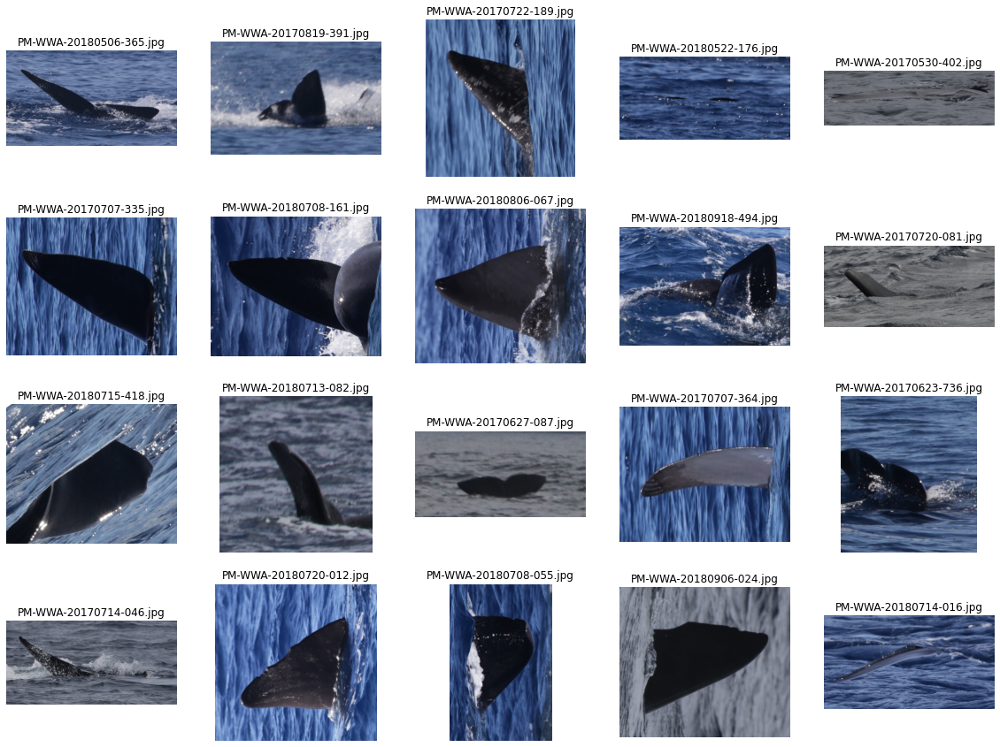

In [85]:
fp = './WC_input/'

f, axarr = plt.subplots(4, 5)
f.set_figwidth(20)
f.set_figheight(15)

for i in range(0, 20):
    img_name = bad_test_img[i]
    img =  plt.imread(fp +'data/'+img_name)

    axarr[int(i/5), i%5].imshow(img)
    axarr[int(i/5), i%5].axis('off')
    axarr[int(i/5), i%5].set_title(img_name)

plt.show()

In [80]:
def remove_bad_images(row):
    row = row.tolist()
    candidates = row[1:]
    cleaned_imgs = [can for can in candidates if can not in bad_imgs]
    if len(cleaned_imgs) < 20:
        print (row[0])
        n = 20 - len(cleaned_imgs)
        cleaned_imgs = cleaned_imgs + candidates[:n]
    return [row[0]] + cleaned_imgs[:20]

In [81]:
remove_bad_images(dist.test.iloc[0])

['PM-WWA-20180811-093.jpg',
 'PM-WWA-20160408-598.jpg',
 'PM-WWA-20100723-339.jpg',
 'PM-WWA-20180627-038.jpg',
 'PM-WWA-20140820-095.jpg',
 'PM-WWA-20110728-029.jpg',
 'PM-WWA-20180522-110.jpg',
 'PM-WWA-20161013-226.jpg',
 'PM-WWA-201006013-314.jpg',
 'PM-WWA-20110724-031.jpg',
 'PM-WWA-20070620-015.jpg',
 'PM-WWA-20180914-075.jpg',
 'PM-WWA-20160722-035.jpg',
 'PM-WWA-20100723-355.jpg',
 'PM-WWA-20140627-075.jpg',
 'PM-WWA-20060422-025.jpg',
 'PM-WWA-20170518-935.jpg',
 'PM-WWA-20170706-637.jpg',
 'PM-WWA-20120806-155.jpg',
 'PM-WWA-20100930-017.jpg',
 'PM-WWA-20080527-205.jpg']

In [82]:
s = dist.test.apply(lambda x: remove_bad_images(x), axis=1)

PM-WWA-20180506-365.jpg
PM-WWA-20170819-391.jpg
PM-WWA-20170722-189.jpg
PM-WWA-20180522-176.jpg
PM-WWA-20170530-402.jpg
PM-WWA-20170707-335.jpg
PM-WWA-20180708-161.jpg
PM-WWA-20180806-067.jpg
PM-WWA-20180918-494.jpg
PM-WWA-20170720-081.jpg
PM-WWA-20180715-418.jpg
PM-WWA-20180713-082.jpg
PM-WWA-20170627-087.jpg
PM-WWA-20170707-364.jpg
PM-WWA-20170623-736.jpg
PM-WWA-20170714-046.jpg
PM-WWA-20180720-012.jpg
PM-WWA-20180708-055.jpg
PM-WWA-20180906-024.jpg
PM-WWA-20180714-016.jpg
PM-WWA-20170921-119.jpg
PM-WWA-20180622-383.jpg
PM-WWA-20170622-486.jpg
PM-WWA-20181004-019.jpg
PM-WWA-20170625-005.jpg
PM-WWA-20180904-089.jpg
PM-WWA-20170921-183.jpg
PM-WWA-20170921-336.jpg
PM-WWA-20180819-230.jpg
PM-WWA-20180621-126.jpg
PM-WWA-20170518-910.jpg
PM-WWA-20170629-073.jpg
PM-WWA-20180522-074.jpg
PM-WWA-20170714-346.jpg
PM-WWA-20170724-108.jpg
PM-WWA-20180813-273.jpg
PM-WWA-20180712-013.jpg
PM-WWA-20180725-013.jpg
PM-WWA-20180506-399.jpg
PM-WWA-20181019-254.jpg
PM-WWA-20180729-012.jpg
PM-WWA-20170414-

In [87]:
dist.test = s.apply(pd.Series)

In [95]:
pip = Post_Pipeline(model_name, fold, checkpoint, algo, dist.test)

In [96]:
dist.test

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,PM-WWA-20180811-093.jpg,PM-WWA-20160408-598.jpg,PM-WWA-20100723-339.jpg,PM-WWA-20180627-038.jpg,PM-WWA-20140820-095.jpg,PM-WWA-20110728-029.jpg,PM-WWA-20180522-110.jpg,PM-WWA-20161013-226.jpg,PM-WWA-201006013-314.jpg,PM-WWA-20110724-031.jpg,...,PM-WWA-20180914-075.jpg,PM-WWA-20160722-035.jpg,PM-WWA-20100723-355.jpg,PM-WWA-20140627-075.jpg,PM-WWA-20060422-025.jpg,PM-WWA-20170518-935.jpg,PM-WWA-20170706-637.jpg,PM-WWA-20120806-155.jpg,PM-WWA-20100930-017.jpg,PM-WWA-20080527-205.jpg
1,PM-WWA-20170710-031.jpg,PM-WWA-20110724-031.jpg,PM-WWA-20160319-207.jpg,PM-WWA-20180801-093.jpg,PM-WWA-20150621-349.jpg,PM-WWA-20170812-048.jpg,PM-WWA-20140618-059.jpg,PM-WWA-20100702-011.jpg,PM-WWA-20170814-156.jpg,PM-WWA-20140603-365.jpg,...,PM-WWA-20150317-222.jpg,PM-WWA-20080516-065.jpg,PM-WWA-20070710-051.jpg,PM-WWA-20090719-064.jpg,PM-WWA-20070703-049.jpg,PM-WWA-20080513-174.jpg,PM-WWA-20160408-579.jpg,PM-WWA-20150906-096.jpg,PM-WWA-20180825-046.jpg,PM-WWA-20060826-088.jpg
2,PM-WWA-20170622-226.jpg,PM-WWA-20170625-283.jpg,PM-WWA-20060819-009.jpg,PM-WWA-20090630-095.jpg,PM-WWA-20140522-120.jpg,PM-WWA-20050709-A001.jpg,PM-WWA-20060914-116.jpg,PM-WWA-20180813-027.jpg,PM-WWA-20180523-066.jpg,PM-WWA-20060929-048.jpg,...,PM-WWA-20050707-159.jpg,PM-WWA-20150414-380.jpg,PM-WWA-20170622-420.jpg,PM-WWA-20160428-241.jpg,PM-WWA-20080807-145.jpg,PM-WWA-20090922-003.jpg,PM-WWA-20050825-102.jpg,PM-WWA-20170727-019.jpg,PM-WWA-20080807-068.jpg,PM-WWA-20060710-058.jpg
3,PM-WWA-20180813-271.jpg,PM-WWA-20060818-192.jpg,PM-WWA-20060530-117.jpg,PM-WWA-20080516-102.jpg,PM-WWA-20050619-189.jpg,PM-WWA-20060613-A051.jpg,PM-WWA-20170715-161.jpg,PM-WWA-20181019-067.jpg,PM-WWA-20100725-472.jpg,PM-WWA-20170624-806.jpg,...,PM-WWA-20070909-146.jpg,PM-WWA-20070616-056.jpg,PM-WWA-20060530-A008.jpg,PM-WWA-20060613-A075.jpg,PM-WWA-20160319-207.jpg,PM-WWA-20060801-178.jpg,PM-WWA-20140618-049.jpg,PM-WWA-20060618-069.jpg,PM-WWA-20060613-A077.jpg,PM-WWA-20070713-020.jpg
4,PM-WWA-20180506-348.jpg,PM-WWA-20180818-156.jpg,PM-WWA-20110720-104.jpg,PM-WWA-201006027-009.jpg,PM-WWA-20130724-143.jpg,PM-WWA-20180519-109.jpg,PM-WWA-20060627-020.jpg,PM-WWA-20140424-137.jpg,PM-WWA-20150818-055.jpg,PM-WWA-20170812-501.jpg,...,PM-WWA-20110823-070.jpg,PM-WWA-20130807-313.jpg,PM-WWA-20180913-272.jpg,PM-WWA-20060608-015.jpg,PM-WWA-20060618-010.jpg,PM-WWA-20170818-239.jpg,PM-WWA-20160808-365.jpg,PM-WWA-20060530-C011.jpg,PM-WWA-20160420-217.jpg,PM-WWA-20120720-027.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
803,PM-WWA-20180805-281.jpg,PM-WWA-20140714-087.jpg,PM-WWA-20160808-261.jpg,PM-WWA-20060612-054.jpg,PM-WWA-20180710-354.jpg,PM-WWA-20160828-008.jpg,PM-WWA-20050822-229.jpg,PM-WWA-20060612-037.jpg,PM-WWA-20090630-112.jpg,PM-WWA-20060612-079.jpg,...,PM-WWA-20090811-065.jpg,PM-WWA-20180619-305.jpg,PM-WWA-20060427-C005.jpg,PM-WWA-20180822-030.jpg,PM-WWA-20070724-030.jpg,PM-WWA-20160814-023.jpg,PM-WWA-20140411-092.jpg,PM-WWA-20130621-033.jpg,PM-WWA-20080624-150.jpg,PM-WWA-20060821-002.jpg
804,PM-WWA-20170624-762.jpg,PM-WWA-20180522-074.jpg,PM-WWA-20170921-183.jpg,PM-WWA-20180729-012.jpg,PM-WWA-20170709-200.jpg,PM-WWA-20170724-108.jpg,PM-WWA-20180506-399.jpg,PM-WWA-20180902-108.jpg,PM-WWA-20180713-082.jpg,PM-WWA-20170707-432.jpg,...,PM-WWA-20170414-363.jpg,PM-WWA-20170722-A092.jpg,PM-WWA-20180622-383.jpg,PM-WWA-20180813-273.jpg,PM-WWA-20170722-189.jpg,PM-WWA-20170710-004.jpg,PM-WWA-20170921-119.jpg,PM-WWA-20170528-016.jpg,PM-WWA-20181019-254.jpg,PM-WWA-20180714-016.jpg
805,PM-WWA-20170801-061.jpg,PM-WWA-20170714-364.jpg,PM-WWA-20170715-021.jpg,PM-WWA-20180913-272.jpg,PM-WWA-20170719-203.jpg,PM-WWA-20120804-082.jpg,PM-WWA-20060627-020.jpg,PM-WWA-20130622-209.jpg,PM-WWA-20070619-018.jpg,PM-WWA-20110825-033.jpg,...,PM-WWA-20080823-133.jpg,PM-WWA-20180606-066.jpg,PM-WWA-20100831-021.jpg,PM-WWA-20100930-017.jpg,PM-WWA-20120623-069.jpg,PM-WWA-20060914-120.jpg,PM-WWA-20080520-199.jpg,PM-WWA-20130829-161.jpg,P

In [97]:
pip.match_images_on_fname()
pip.view_matched_images()

KeyError: 0

In [ ]:
%debug

> /home/jupyter-philippschw/whale_pytorch/pandas/_libs/hashtable_class_helper.pxi(1626)pandas._libs.hashtable.PyObjectHashTable.get_item()

ipdb> u
> /home/jupyter-philippschw/whale_pytorch/pandas/_libs/hashtable_class_helper.pxi(1618)pandas._libs.hashtable.PyObjectHashTable.get_item()

ipdb> u
> /home/jupyter-philippschw/whale_pytorch/pandas/_libs/index.pyx(138)pandas._libs.index.IndexEngine.get_loc()

ipdb> u
> /home/jupyter-philippschw/whale_pytorch/pandas/_libs/index.pyx(111)pandas._libs.index.IndexEngine.get_loc()

ipdb> u
> /opt/tljh/user/envs/keras/lib/python3.6/site-packages/pandas/core/indexes/base.py(2648)get_loc()
   2646                 return self._engine.get_loc(key)
   2647             except KeyError:
-> 2648                 return self._engine.get_loc(self._maybe_cast_indexer(key))
   2649         indexer = self.get_indexer([key], method=method, tolerance=tolerance)
   2650         if indexer.ndim > 1 or indexer.size > 1:

ipdb> u
> /opt/tljh/user/envs/keras/lib/python

In [17]:
df1 = pip.infer_missing_from_train_set()
df2 = pip.match_images_on_fname()
df12 = pip.match_images_on_fname(df1)

In [18]:
df12.to_csv('predictions12.csv', header=None)

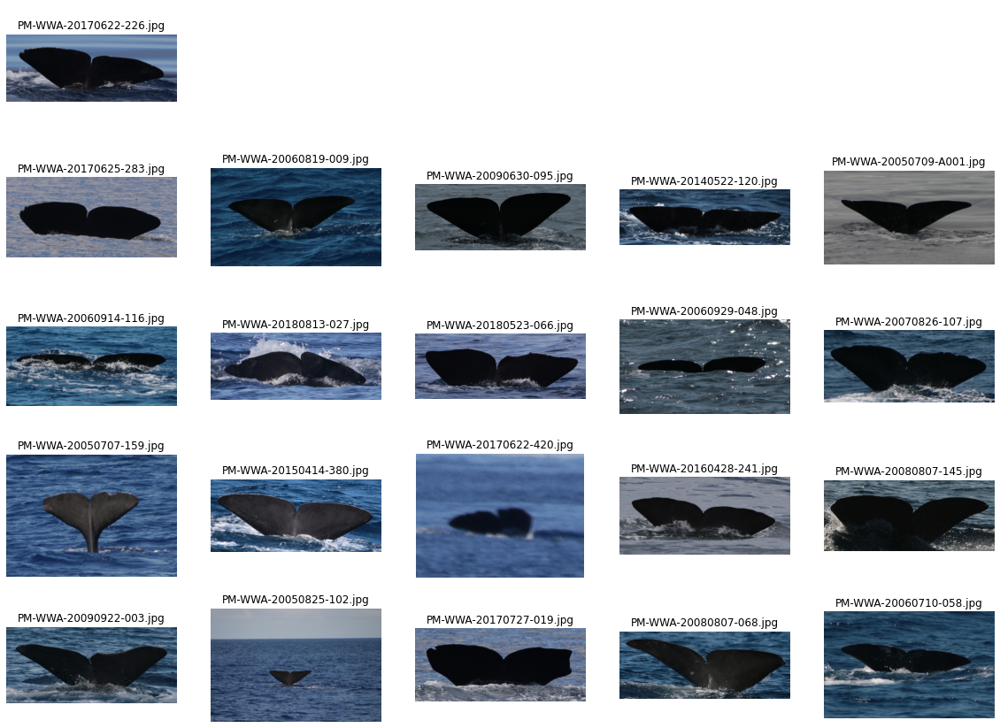

In [19]:
pip.show_top20_imgs('PM-WWA-20170622-226.jpg')

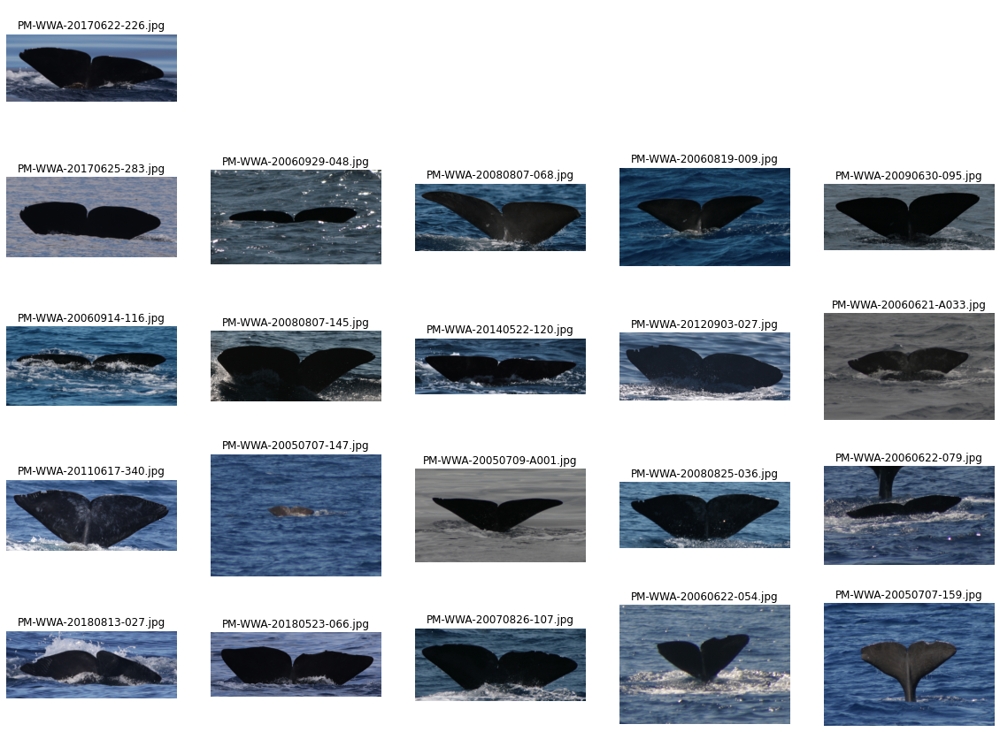

In [20]:
pip.show_top20_imgs('PM-WWA-20170622-226.jpg', df1)

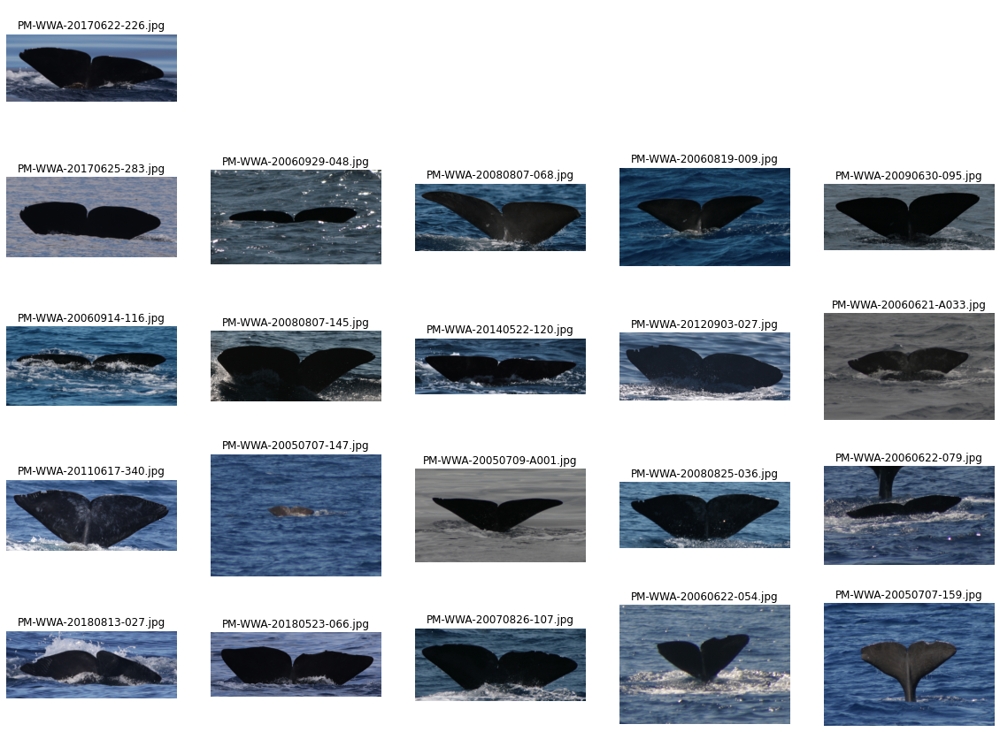

In [21]:
pip.show_top20_imgs('PM-WWA-20170622-226.jpg', df12)

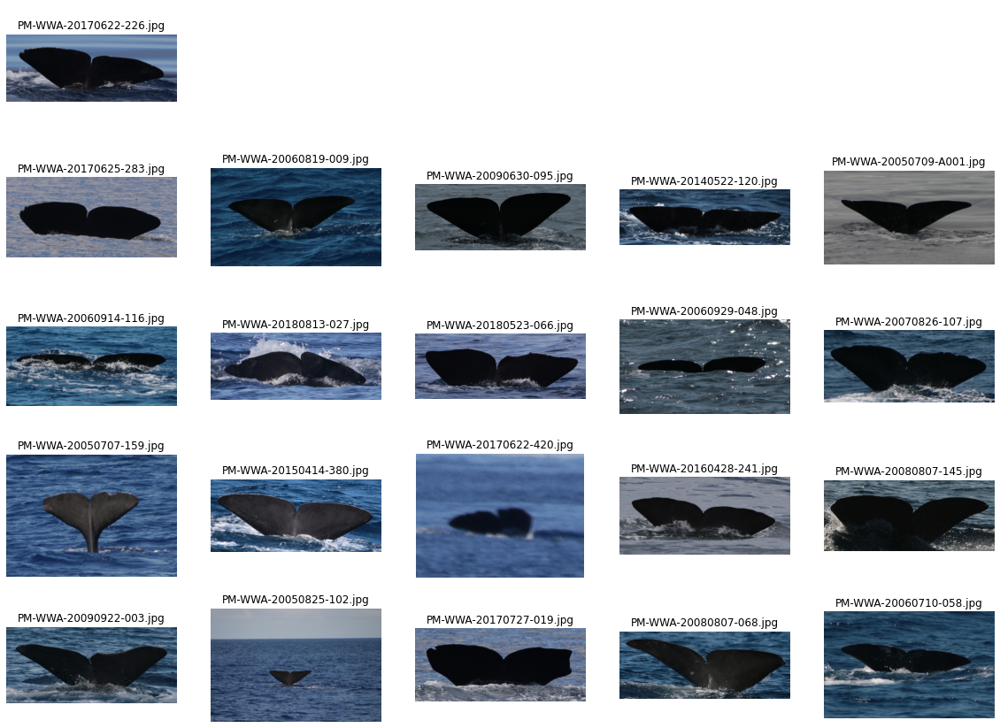

In [22]:
pip.show_top20_imgs('PM-WWA-20170622-226.jpg', df2)

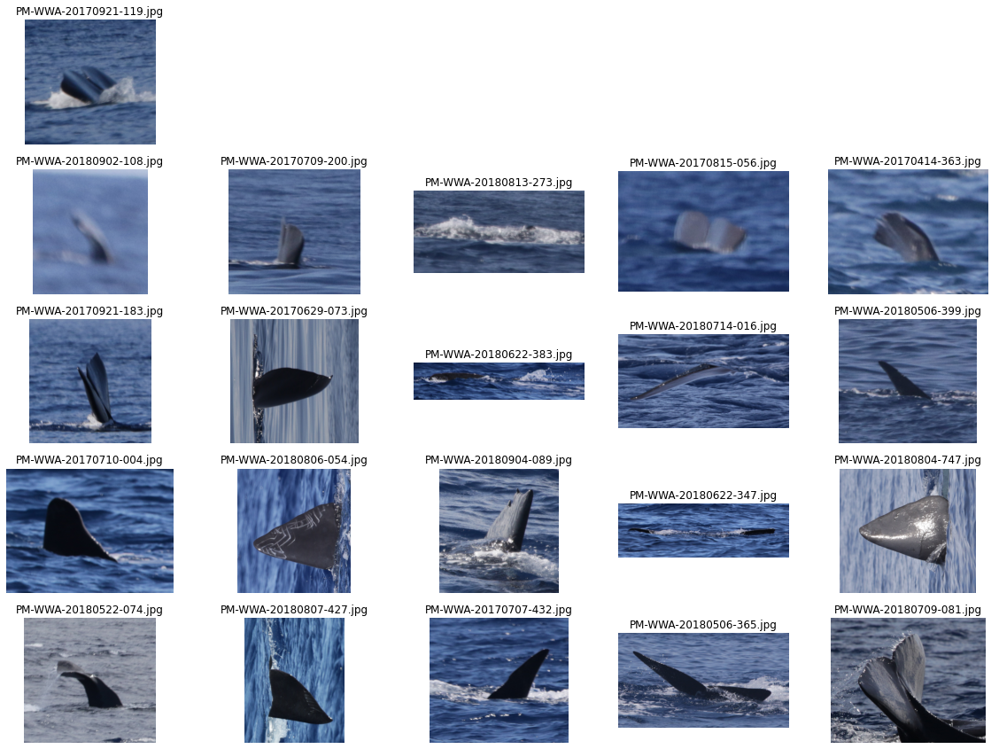

In [24]:
pip.show_top20_imgs('PM-WWA-20170921-119.jpg', df2)

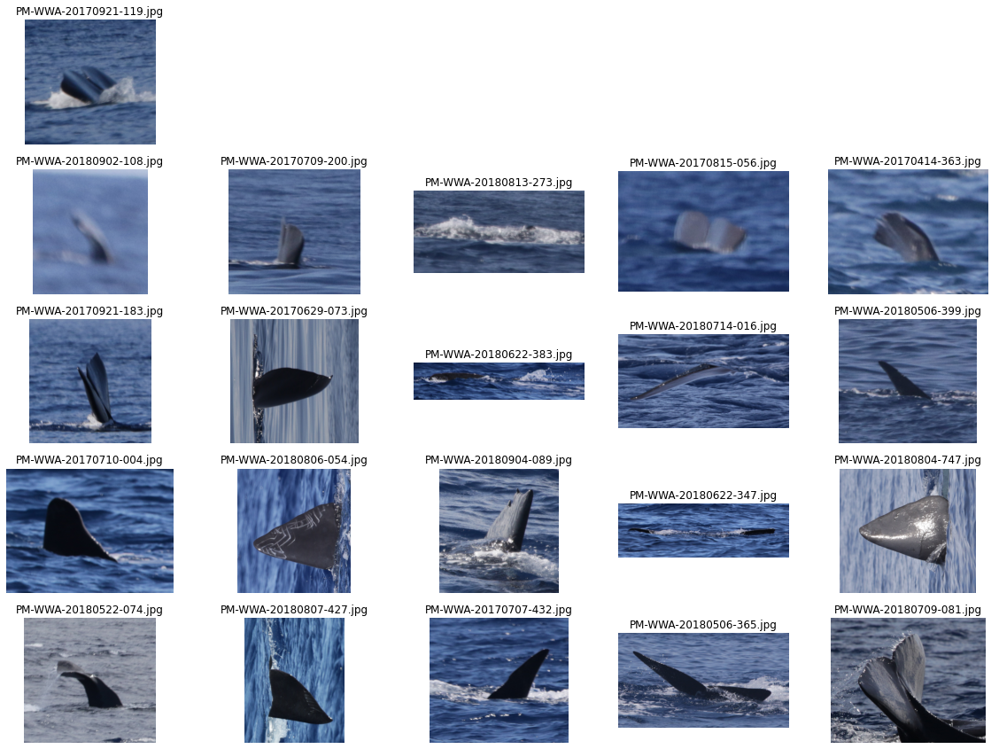

In [25]:
pip.show_top20_imgs('PM-WWA-20170921-119.jpg')

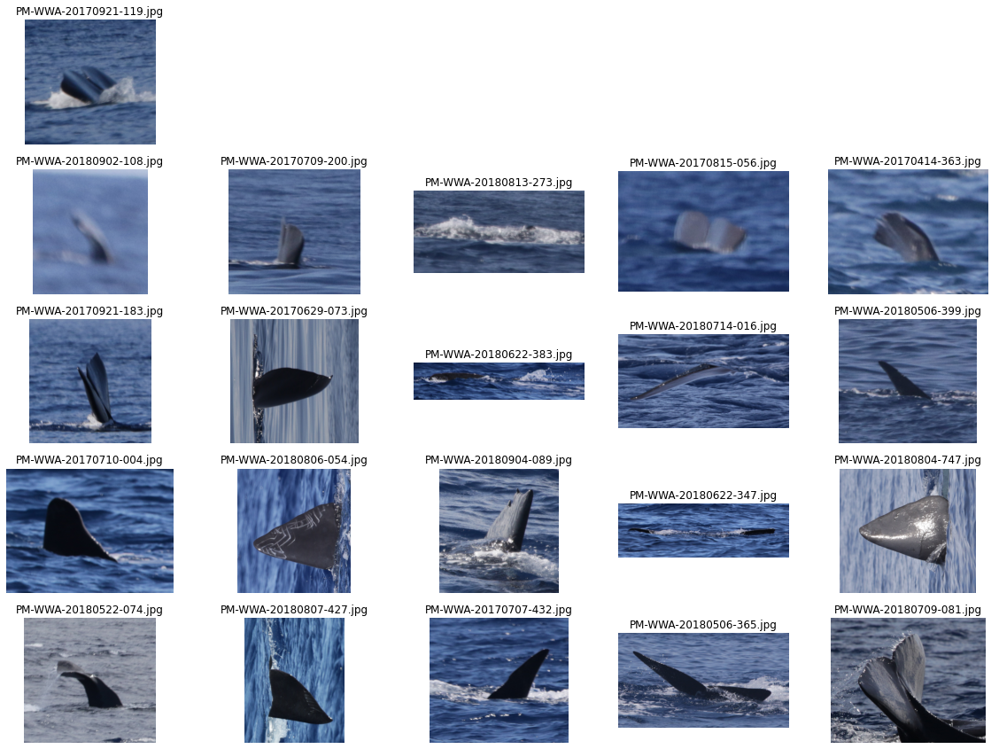

In [26]:
pip.show_top20_imgs('PM-WWA-20170921-119.jpg', df12)

In [ ]:
pip.show_top20_imgs('PM-WWA-20170921-119.jpg', df2)